# VAE for MNIST dataset #

In [1]:
# Number of workers for training
num_workers = 4
# Batch size during training
batch_size = 512
# Spatial size of training images
image_size = 28 #64
# Number of channels in the training images. For color images this is 3. For grayscale image (e.g. MNIST) is 1.
nc = 1
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 32
# Size of feature maps in discriminator
ndf = 32
# Number of training epochs
num_epochs = 50
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Beta2 hyperparam for Adam optimizers
beta2 = 0.999
# KLD weight for loss function
kld_weight = 1.e-2

## Step1.1. Lightning data module for MNIST dataset ##
MNIST data set is normalized to [-1, 1] bacause `Tanh` is used in Generator.

In [2]:
import os
import torch
from torch.utils.data import Dataset

from pytorch_lightning import LightningDataModule
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import MNIST
from torchvision import transforms
from typing import Optional

torch.manual_seed(111)


class MNISTDataset(LightningDataModule):
    def __init__(
        self,
        data_path: str,
        batch_size: int = 128,
        num_workers: int = num_workers
        ):
        super().__init__()
        self.data_dir = data_path
        self.transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])
        self.batch_size = batch_size
        self.num_workers = num_workers

    def setup(self, stage: Optional[str] = None) -> None:
        full_data = MNIST(os.getcwd(), train=True,  download=True, transform=self.transform)
        self.train_data, self.val_data = random_split(full_data, [50000, 10000])
        self.test_data  = MNIST(os.getcwd(), train=False, download=True, transform=self.transform)
        self.pred_data  = self.train_data
        
    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.batch_size, num_workers=self.num_workers)
    
    def predict_dataloader(self):
        return DataLoader(self.pred_data, batch_size=self.batch_size, num_workers=self.num_workers)
    

## Step1.2. Encoder and Decoder, Vector quantiser for VQ-VAE ##

### Encoder ###

In [3]:
from torch import nn 

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(ndf*2, ndf*4, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(ndf*4, ndf*8, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        return x


### Decoder ###

In [4]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        
        self.conv_transpose1 = nn.Sequential(         
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv_transpose2 = nn.Sequential(
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv_transpose3 = nn.Sequential(
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv_transpose4 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        z = self.conv_transpose1(z)
        z = self.conv_transpose2(z)
        z = self.conv_transpose3(z)
        z = self.conv_transpose4(z)
        
        return z

### Vector Quantiser ###

In [5]:
from torch import Tensor

class VectorQuantiser(nn.Module):
    """
    Reference:
    [1] https://github.com/deepmind/sonnet/blob/v2/sonnet/src/nets/vqvae.py
    """
    def __init__(self,
                 num_embeddings: int,
                 embedding_dim: int,
                 beta: float = 0.25):
        super(VectorQuantiser, self).__init__()
        self.K = num_embeddings
        self.D = embedding_dim
        self.beta = beta

        self.embedding = nn.Embedding(self.K, self.D)
        self.embedding.weight.data.uniform_(-1 / self.K, 1 / self.K)

        self.latent_shape = None
        self.device = None

    def forward(self, latents: Tensor) -> Tensor:
        latents = latents.permute(0, 2, 3, 1).contiguous()
        latents_shape = latents.shape
        self.latents_shape = latents.shape
        self.device = latents.device
        flat_latents = latents.view(-1, self.D)  # [BHW x D]

        # Compute L2 distance between latents and embedding weights
        dist = torch.sum(flat_latents ** 2, dim=1, keepdim=True) + \
               torch.sum(self.embedding.weight ** 2, dim=1) - \
               2 * torch.matmul(flat_latents, self.embedding.weight.t())

        # Get the encoding that has the min distance
        encoding_inds_flat = torch.argmin(dist, dim=1).unsqueeze(1)
        encoding_inds = encoding_inds_flat.view(*latents.shape[:3]).unsqueeze(dim=1)

        # Convert to one-hot encodings
        device = latents.device
        encoding_one_hot = torch.zeros(encoding_inds_flat.size(0), self.K, device=device)
        encoding_one_hot.scatter_(1, encoding_inds_flat, 1)

        # Quantize the latents
        quantized_latents = torch.matmul(encoding_one_hot, self.embedding.weight)
        quantized_latents = quantized_latents.view(latents_shape)

        # Compute the VQ Losses
        commitment_loss = F.mse_loss(quantized_latents.detach(), latents)
        embedding_loss = F.mse_loss(quantized_latents, latents.detach())

        vq_loss = commitment_loss * self.beta + embedding_loss

        # Add the residue back to the latents
        quantized_latents = latents + (quantized_latents - latents).detach()

        return quantized_latents.permute(0, 3, 1, 2).contiguous(), vq_loss, encoding_inds
    
    def embed(self, inds):
        # Convert to one-hot encodings
        device = self.device
        inds_flat = inds.view(-1).unsqueeze(dim=1)
        one_hot = torch.zeros(inds_flat.size(0), self.K, device=device)
        one_hot.scatter_(1, inds_flat, 1) 

        # Quantize the latents
        quantized_latents = torch.matmul(one_hot, self.embedding.weight)
        quantized_latents = quantized_latents.view(-1, *self.latents_shape[1:])

        return quantized_latents.permute(0, 3, 1, 2).contiguous()
    

## Step1.3. VQ-VAE ##

In [6]:
from typing import Any, Optional
from pytorch_lightning.utilities.types import STEP_OUTPUT
from torch.nn import functional as F
from torch import optim
from torch import Tensor
from pytorch_lightning import LightningModule
from torchvision.utils import make_grid
from torchmetrics.image.fid import FrechetInceptionDistance

class VQVAE(LightningModule):
    def __init__(
        self,
        lr: float = lr,
        b1: float = beta1,
        b2: float = beta2,
        batch_size : int = 128,
        kld_weight: float = kld_weight,
        **kwargs
    ):
        super().__init__()
        self.save_hyperparameters()

        self.encoder = Encoder()
        self.decoder = Decoder()
        self.vq = VectorQuantiser(num_embeddings=256, embedding_dim=256)
        self.automatic_optimization = False
        self.training_step_loss = []
        self.training_epoch_losses = []

        self.e_example = None
        self.d_example = {}
        self.z_example = {}
        self.zq_example = {}

    def forward(self, z):
        return self.decoder(z)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)

        return mu + eps * std
    
    def critic(self, fake_image, image):
        mse_loss = F.mse_loss(fake_image, image)

        return mse_loss



    def configure_optimizers(self):
        lr = self.hparams.lr
        b1 = self.hparams.b1
        b2 = self.hparams.b2
        opt = torch.optim.Adam(self.parameters())
        
        return opt

    def training_step(self, batch, batch_size):
        images, _ = batch

        opt = self.optimizers()
        opt.zero_grad()

        z = self.encoder(images)
        self.z_sample  = z
        zq, vq_loss, indices = self.vq(z)
        recon_images = self(zq)
        loss = self.critic(recon_images, images) + vq_loss

        self.manual_backward(loss)
        opt.step()

        self.log('loss', loss, prog_bar=True, on_step=True)
        self.training_step_loss.append(loss)

        return loss

    def validation_step(self, batch, batch_size) -> None:
        images, _ = batch
        if self.e_example == None:
            self.e_example = images[:64]

    def predict_step(self, batch):
        images, _ = batch
        if self.e_example == None:
            self.e_example = images[:64]

        z = self.encoder(images)
        self.z_sample  = z 
        zq, _, _ = self.vq(z)
        recon_images = self(zq)

    def on_train_epoch_end(self) -> None:
        training_epoch_loss = torch.stack(self.training_step_loss).mean()
        self.training_step_loss.clear()
        self.log('epoch_loss', training_epoch_loss, prog_bar=True, on_epoch=True)
        self.training_epoch_losses.append(training_epoch_loss)

        # encode - decode
        z = self.encoder(self.e_example)
        self.z_example[self.current_epoch] = z
        zq, _, _ = self.vq(z)
        self.zq_example[self.current_epoch] = zq
        recon_imgs = self(zq)
        self.d_example[self.current_epoch] = make_grid(recon_imgs, nrow=8)

        '''
        # FID. If you don't need FID metrics, please comment out.
        sample_images_3ch = sample_images.expand(sample_images.size(0), 3, sample_images.size(2), sample_images.size(3)).type(torch.uint8).to(self.device)
        self.fid.update(sample_images_3ch, real=False)
        fid_metrics = self.fid.compute().item()
        self.log('FID', fid_metrics, prog_bar=True, on_epoch=True)
        '''


## Step1.4. Logger ##

In [7]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(save_dir='./tb_logs/', name = 'VQ-VAE')


#%reload_ext tensorboard
#%tensorboard --logdir=./tb_logs/

## Step1.5. Build & fit model ##

In [8]:
data = MNISTDataset(data_path = './', batch_size=batch_size)
model = VQVAE()

In [9]:
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks.progress import TQDMProgressBar

runner = Trainer(max_epochs=num_epochs,
                 #gpus=[0], # comment out if you use 'cpu'
                 accelerator='gpu',  # 'cpu', or 'gpu', 'auto'
                 logger=logger, 
                 callbacks=[TQDMProgressBar(refresh_rate=10)])


runner.fit(model, data)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./tb_logs/VQ-VAE
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type            | Params
--------------------------------------------
0 | encoder | Encoder         | 689 K 
1 | decoder | Decoder         | 689 K 
2 | vq      | VectorQuantiser | 65.5 K
--------------------------------------------
1.4 M     Trainable params
0         Non-trainable params
1.4 M     Total params
5.777     Total estimated model params size (MB)


Epoch 49: 100%|██████████| 98/98 [00:04<00:00, 22.15it/s, v_num=0, loss=0.0891, epoch_loss=0.091] 

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 98/98 [00:04<00:00, 20.25it/s, v_num=0, loss=0.0891, epoch_loss=0.091]


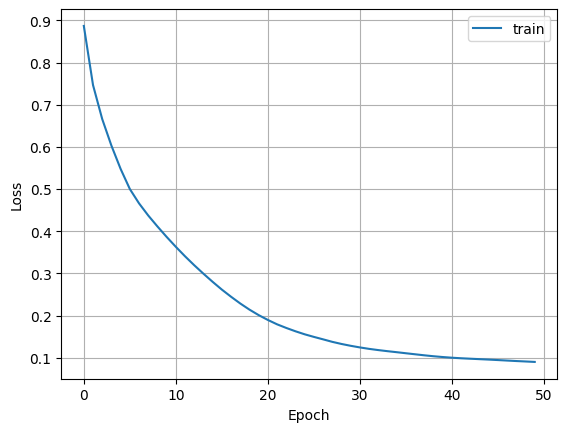

In [10]:
import matplotlib.pyplot as plt

train_losses = [i.to('cpu').detach().numpy() for i in model.training_epoch_losses]

plt.plot(train_losses, label='train')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

## Step1.6. Check the reconstructed images ##

### Input images

(242, 242)



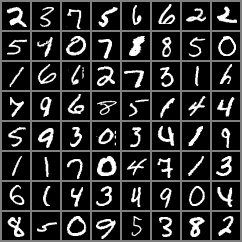

In [11]:
import numpy as np
import plotly.express as px

real_images_grid = make_grid(model.e_example, nrow=8)

imgs = real_images_grid.to('cpu').detach().numpy()[0]
print(imgs.shape)

fig = px.imshow(imgs, binary_string=True)
fig.update_layout(
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()

### Reconstracted images ###

(50, 242, 242)



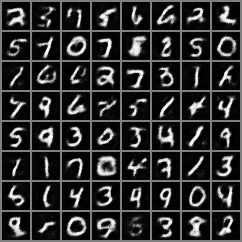
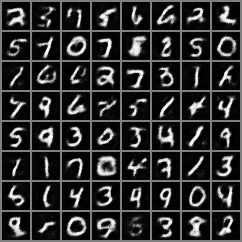
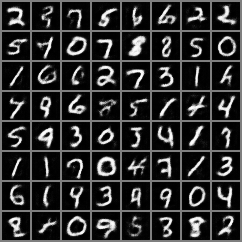
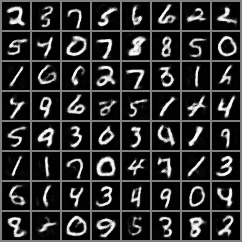
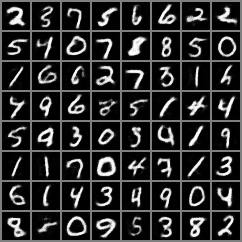
...
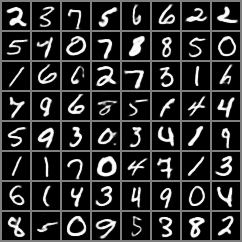
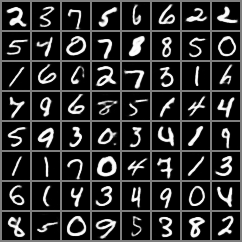
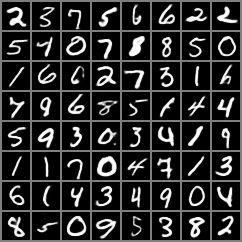
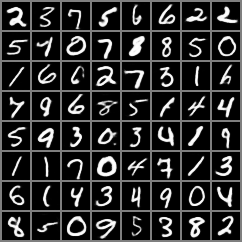
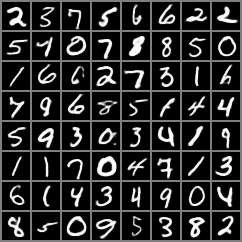

In [12]:
import numpy as np
import plotly.express as px

recon_images = model.d_example
imgs = np.array([recon_images[i][0].to(torch.device('cpu')).detach().numpy() for i in recon_images])
print(imgs.shape)

fig = px.imshow(imgs, animation_frame=0, binary_string=True)
fig.update_layout(
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()

### (Optional) Latent space ###

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


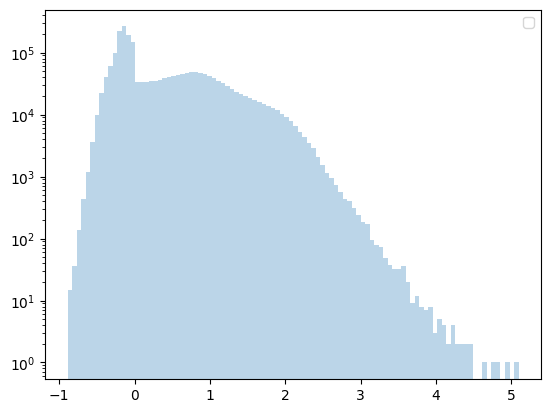

In [13]:
import matplotlib.pyplot as plt
z_sample = model.z_sample.to('cpu').detach().numpy().flatten()

plt.hist(z_sample, bins=100, alpha=0.3)
plt.yscale('log')
plt.legend()
plt.show()

# Step2. PixelCNNs #

## Step2.1. Latent vectors for training PixelCNNs ##

In [14]:

class ZDataset(LightningDataModule):
    def __init__(
        self,
        model_vqvae,
        dataloader_vqvae,
        batch_size: int = 512,
        num_workers: int = num_workers
        ):
        super().__init__()

        self.model_vqvae = model_vqvae
        self.dataloader_vqvae = dataloader_vqvae
        self.batch_size = batch_size
        self.num_workers = num_workers

    def setup(self, stage: Optional[str] = None) -> None:
        self.dataloader_vqvae.setup(stage=stage)

        if stage == 'fit' or stage is None:
            # latent vector for training
            z_imgs = []
            labels = []
            for img, label in self.dataloader_vqvae.train_dataloader():
                with torch.no_grad():
                    z = self.model_vqvae.encoder(img)
                    _, _, inds = self.model_vqvae.vq(z)
                    z_imgs.append(inds)
                    labels.append(label)
            self.train_data = torch.utils.data.TensorDataset( torch.cat(z_imgs, dim=0), torch.cat(labels, dim=0) )

            # latent vector for validation
            z_imgs = []
            labels = []
            for img, label in self.dataloader_vqvae.val_dataloader():
                with torch.no_grad():
                    z = self.model_vqvae.encoder(img)
                    _, _, inds = self.model_vqvae.vq(z)
                    z_imgs.append(inds)
                    labels.append(label)
            self.val_data = torch.utils.data.TensorDataset( torch.cat(z_imgs, dim=0), torch.cat(labels, dim=0) )

        if stage == 'test' or stage is None:
            # latent vector for test
            z_imgs = []
            labels = []
            for img, label in self.dataloader_vqvae.test_dataloader():
                with torch.no_grad():
                    z = self.model_vqvae.encoder(img)
                    _, _, inds = self.model_vqvae.vq(z)
                    z_imgs.append(inds)
                    labels.append(label)

    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.batch_size, num_workers=self.num_workers)    

## Step2.2. Gated PixelCNNs ##

#### GateActivation ####

In [15]:
class GatedActivation(nn.Module):
    def __init__(self):
        super(GatedActivation, self).__init__()
  
    def forward(self, x):
        x, y = x.chunk(2, dim=1)
        return torch.tanh(x) * torch.sigmoid(y)

#### GatedMaskedConv2D ####

In [16]:
from torch.distributions import Categorical

class GatedMaskedConv2d(nn.Module):
    
    def __init__(self, mask_type, hidden_channels, kernel_size, residual, num_classes):
        super(GatedMaskedConv2d, self).__init__()
        self.mask_type = mask_type
        self.residual = residual

        h = hidden_channels

        self.class_cond_embedding = nn.Embedding(num_classes, h * 2)

        self.vert_stack = nn.Conv2d(
            h, h * 2, kernel_size=(kernel_size // 2 + 1, kernel_size), stride=1,
            padding=(kernel_size // 2, kernel_size // 2)
        )
        self.vert_to_horiz = nn.Conv2d(h * 2, h * 2, kernel_size=1, stride=1, padding=0)
        self.horiz_stack = nn.Conv2d(h, h * 2, kernel_size=(1, kernel_size // 2 + 1), stride=1,
                                      padding=(0, kernel_size // 2))
        self.horiz_resid = nn.Conv2d(h, h, kernel_size=1, stride=1, padding=0)

        self.gate = GatedActivation()
  
    def make_causal(self):
        self.vert_stack.weight.data[:, :, -1].zero_()  # mask final row
        self.horiz_stack.weight.data[:, :, :, -1].zero_()  # mask final column

    def forward(self, x_v, x_h, h):
        if self.mask_type == 'A':
            self.make_causal()

        h = self.class_cond_embedding(h)
        h_vert = self.vert_stack(x_v)
        h_vert = h_vert[:, :, :x_v.size(-1), :]
        out_v = self.gate(h_vert + h[:, :, None, None])

        h_horiz = self.horiz_stack(x_h)
        h_horiz = h_horiz[:, :, :, :x_h.size(-2)]
        v2h = self.vert_to_horiz(h_vert)

        out = self.gate(v2h + h_horiz + h[:, :, None, None])
        if self.residual:
            out_h = self.horiz_resid(out) + x_h
        else:
            out_h = self.horiz_resid(out)

        return out_v, out_h

#### GatedPixelCNNs ####

In [17]:
class GatedPixelCNNs(nn.Module):
    
    def __init__(self, num_classes, in_channels, hidden_channels, output_channels, num_layers):
        super(GatedPixelCNNs, self).__init__()
        self.num_classes = num_classes

        self.embedding = nn.Embedding(in_channels, hidden_channels)

        self.mask_a = GatedMaskedConv2d('A', hidden_channels, kernel_size=7,
                                        residual=False, num_classes=num_classes)
        self.mask_bs = nn.ModuleList([
            GatedMaskedConv2d('B', hidden_channels, kernel_size=3,
                              residual=True, num_classes=num_classes) for _ in range(num_layers - 1)])

        self.output_conv = nn.Sequential(
            nn.Conv2d(hidden_channels, output_channels, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_channels, in_channels, kernel_size=1, stride=1, padding=0)
        )

    def forward(self, x, y):
        x = self.embedding(x.view(-1)).view(x.shape + (-1,))  # (B, H, W, C)
        x = x.permute(0, 3, 1, 2)  # (B, C, H, W)

        x_v, x_h = self.mask_a(x, x, y)
        for mask_b in self.mask_bs:
            x_v, x_h = mask_b(x_v, x_h, y)

        return self.output_conv(x_h)

## Step2.3 PixelCNNs ##

In [18]:
class PixelCNNs(LightningModule):
    def __init__(
        self,
        num_classes: int,
        in_channels: int,
        hidden_channels: int,
        output_channels: int,
        num_layers: int,
        **kwargs
        ):
        super().__init__()
        self.save_hyperparameters()
        self.automatic_optimization = False

        self.num_classes = num_classes
        self.in_channels = in_channels
        self.pixelcnns= GatedPixelCNNs(num_classes, in_channels, hidden_channels, output_channels, num_layers)

        self.training_step_loss = []
        self.training_epoch_losses = []
        self.validation_step_loss = []
        self.validation_epoch_losses = []        

    def forward(self, z, y):
        return self.pixelcnns(z, y)


    def configure_optimizers(self):
        opt = torch.optim.Adam(self.parameters())
        
        return opt
    
    def training_step(self, batch, batch_size):
        image_z, label = batch
        image_z = image_z.squeeze(dim=1)

        opt = self.optimizers()
        opt.zero_grad()

        out = self(image_z, label).permute(0,2,3,1).reshape(-1,self.in_channels)
        loss = F.cross_entropy(out, image_z.view(-1))

        self.manual_backward(loss)
        opt.step()

        self.log('loss training', loss, prog_bar=True, on_step=True)
        self.training_step_loss.append(loss)

        return loss
    

    def validation_step(self, batch, batch_size) -> None:
        image_z, label = batch
        image_z = image_z.squeeze(dim=1)

        out = self(image_z, label).permute(0,2,3,1).reshape(-1,self.in_channels)
        loss = F.cross_entropy(out, image_z.view(-1))
        self.log('loss validation', loss, prog_bar=True, on_step=True)
        self.validation_step_loss.append(loss)

        return loss

    def on_train_epoch_end(self) -> None:
        if self.current_epoch == 0:
            self.training_epoch_losses.append(torch.Tensor([0.])[0])
        training_epoch_loss = torch.stack(self.training_step_loss).mean()
        self.training_step_loss.clear()
        self.log('training_epoch_loss', training_epoch_loss, prog_bar=True, on_epoch=True)
        self.training_epoch_losses.append(training_epoch_loss)


    def on_validation_epoch_end(self) -> None:
        validation_epoch_loss = torch.stack(self.validation_step_loss).mean()
        self.validation_step_loss.clear()
        self.log('validation_epoch_loss', validation_epoch_loss, prog_bar=True, on_epoch=True)
        self.validation_epoch_losses.append(validation_epoch_loss)

    def sample(self, batch_size, shape, label=None):
        self.eval()

        x = torch.zeros((batch_size, *shape), dtype=torch.long, device=self.device)
        if label is None:
            label = torch.randint(self.num_classes, (batch_size,), dtype=torch.long, device=self.device)

        with torch.no_grad():
            for i in range(shape[0]):
                for j in range(shape[1]):
                    logits = self.forward(x, label)
                    dist = Categorical(logits=logits[:, :, i, j])
                    x[:, i, j] = dist.sample()
                    
        return x

## Step2.4 Log ##

In [19]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(save_dir='./tb_logs/', name = 'PixelCNNs')


## Step2.5 Build & fit model ##

In [20]:
data_z = ZDataset(model_vqvae=model, dataloader_vqvae=data, batch_size=batch_size)
model_prior = PixelCNNs(num_classes=10, in_channels=256, hidden_channels=64, output_channels=512, num_layers=2)

In [21]:

runner_prior = Trainer(max_epochs=num_epochs,
                 #gpus=[0], # comment out if you use 'cpu'
                 accelerator='gpu',  # 'cpu', or 'gpu', 'auto'
                 logger=logger, 
                 callbacks=[TQDMProgressBar(refresh_rate=10)])


runner_prior.fit(model_prior, data_z)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./tb_logs/PixelCNNs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type           | Params
---------------------------------------------
0 | pixelcnns | GatedPixelCNNs | 553 K 
---------------------------------------------
553 K     Trainable params
0         Non-trainable params
553 K     Total params
2.212     Total estimated model params size (MB)


Epoch 49: 100%|██████████| 98/98 [00:02<00:00, 37.37it/s, v_num=0, loss training=1.400, loss validation_step=1.760, loss validation_epoch=1.760, validation_epoch_loss=1.760, training_epoch_loss=1.500]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 98/98 [00:02<00:00, 36.06it/s, v_num=0, loss training=1.400, loss validation_step=1.760, loss validation_epoch=1.760, validation_epoch_loss=1.760, training_epoch_loss=1.500]


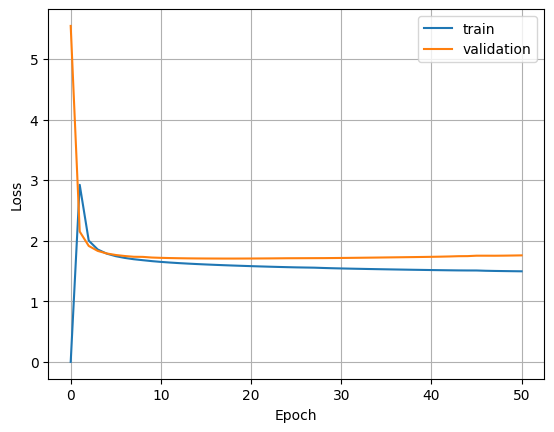

In [22]:
import matplotlib.pyplot as plt

prior_train_losses = [i.to('cpu').detach().numpy() for i in model_prior.training_epoch_losses]
prior_val_losses = [i.to('cpu').detach().numpy() for i in model_prior.validation_epoch_losses]

plt.plot(prior_train_losses, label='train')
plt.plot(prior_val_losses, label='validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

# Step3. PixelCNNs + VQ-VAE #

## Step3.1. Apply PixelCNN to VQ-VAE as a prior ##

In [23]:
from torchvision.utils import make_grid

class VQVAE2(nn.Module):
    def __init__(
            self,
            prior,
            vqvae,
            latent_shape = (5,5)):
        super().__init__()
        self.prior = prior
        self.vqvae = vqvae
        self.latent_shape = latent_shape
        self.generated_images_grid = {}
        self.z_sample = None

    def generate_prior(self, batch_size, label=None):
        z = self.prior.sample(batch_size=batch_size, shape=(5,5), label=label)
        self.z_sample = z
        self.vqvae.eval()
        with torch.no_grad():
            qz = self.vqvae.vq.embed(z)
        
        return qz
    
    def generate(self, batch_size, label=None):
        qz = self.generate_prior(batch_size=batch_size, label=label)
        with torch.no_grad():
            fake_images = self.vqvae.decoder(qz)
        
        grid = make_grid(fake_images, nrow=8)
        self.generated_images_grid[0] = grid
        return fake_images

In [24]:
model_vqvae2 = VQVAE2(prior=model_prior, vqvae=model, latent_shape=(5,5))

## Step3.2. Check the generated images ##

### Generate images ###

(1, 242, 242, 3)



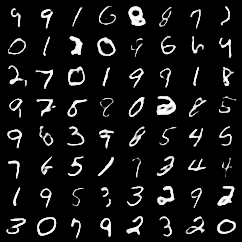
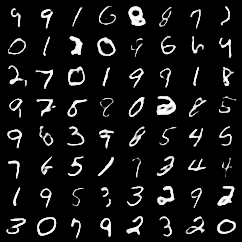

In [25]:
import numpy as np
import plotly.express as px

model_vqvae2.generate(batch_size=64, label=None)
fake_images_grid = model_vqvae2.generated_images_grid

imgs = np.array([fake_images_grid[i].to(torch.device('cpu')).numpy() for i in fake_images_grid]).transpose(0,2,3,1)
print(imgs.shape)

fig = px.imshow(imgs, animation_frame=0, binary_string=True)
fig.update_layout(
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()

### Generate images of *5* ###

(1, 242, 242, 3)



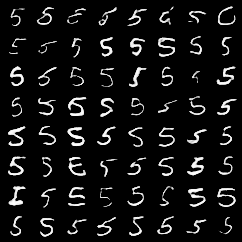
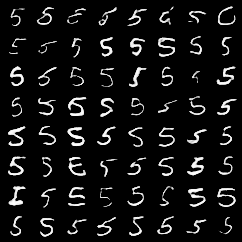

In [26]:
model_vqvae2.generate(batch_size=64, label=torch.full((64,), 5, dtype=torch.long, device='cpu'))
fake_images_grid = model_vqvae2.generated_images_grid

imgs = np.array([fake_images_grid[i].to(torch.device('cpu')).numpy() for i in fake_images_grid]).transpose(0,2,3,1)
print(imgs.shape)

fig = px.imshow(imgs, animation_frame=0, binary_string=True)
fig.update_layout(
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()

## Step3.3. t-SNE of MNIST images ##

### Real images ###

In [27]:
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np

tsne = TSNE(n_components=2, random_state=0)



mnist_tmp = MNIST(os.getcwd(), 
                  train=False, 
                  download=True, 
                  transform=transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])
                  )


real_mnist_data = np.array([mnist_tmp[i][0].numpy() for i in range(10000)])
real_mnist_data = real_mnist_data.reshape(real_mnist_data.shape[0],-1)
real_mnist_label = mnist_tmp.test_labels.numpy().reshape(-1,1).astype(dtype=str)

tsne_real_mnist = tsne.fit_transform(real_mnist_data)
print(tsne_real_mnist.shape)
df_tsne_real_mnist = pd.concat([pd.DataFrame(real_mnist_label), pd.DataFrame(tsne_real_mnist)], axis=1)
df_tsne_real_mnist.columns = ['label', 'component 1', 'component 2']

/home/hep/shayashi/.pyenv/versions/3.8.6/lib/python3.8/site-packages/torchvision/datasets/mnist.py:70: UserWarning:

test_labels has been renamed targets



(10000, 2)


In [28]:
label_order = [str(i) for i in range(10)]
colors = px.colors.qualitative.Plotly

fig = px.scatter(data_frame = df_tsne_real_mnist, x='component 1', y='component 2', color='label', color_discrete_sequence=colors, category_orders={'label':label_order})

fig.update_layout(title='t-SNE, Real MNIST', width=800, height=800)
fig.show()

### Real+Fake images ###

In [29]:
fake_images = model_vqvae2.generate(batch_size = 1024)

fake_mnist_data = fake_images.to(torch.device('cpu')).detach().numpy()
print(fake_mnist_data.shape)
fake_mnist_data = fake_mnist_data.reshape(fake_mnist_data.shape[0], -1)

df_tsne_fake_mnist = pd.DataFrame([])

real_fake_data = np.concatenate([real_mnist_data, fake_mnist_data], axis=0)
real_fake_label = np.concatenate([real_mnist_label, np.full((fake_mnist_data.shape[0],1), 'fake')], axis=0)

tsne_real_fake_mnist = tsne.fit_transform(real_fake_data)

df_tmp = pd.concat([pd.DataFrame(real_fake_label), pd.DataFrame(tsne_real_fake_mnist)], axis=1)
df_tsne_fake_mnist = pd.concat([df_tsne_fake_mnist, df_tmp], axis=0)
df_tsne_fake_mnist.columns = ['label', 'component 1', 'component 2']

(1024, 1, 28, 28)


In [30]:
label_order.append('fake')
colors.append('black')
fig = px.scatter(data_frame = df_tsne_fake_mnist, x='component 1', y='component 2', color='label', color_discrete_sequence=colors, category_orders={'label':label_order})

fig.update_layout(title='t-SNE, Real+Fake MNIST', width=800, height=800)
fig.show()

## Step3.4. Check the latent space ##

### t-SNE of latent space images for training PixelCNNs ###

In [31]:
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np

tsne = TSNE(n_components=2, random_state=0)

z_imgs = []
z_labels = []
data_z.setup()
for i,j in data_z.train_dataloader():
    z_imgs.append(i.to('cpu').detach().numpy())
    z_labels.append(j.to('cpu').detach().numpy())
z_imgs = np.vstack(z_imgs).reshape(-1, 25)
z_labels = np.hstack(z_labels).flatten().astype(dtype=str)
print(z_imgs.shape, z_labels.shape)
tsne_z = tsne.fit_transform(z_imgs)
print(tsne_z.shape)
df_tsne_z = pd.concat([pd.DataFrame(z_labels), pd.DataFrame(tsne_z)], axis=1)
df_tsne_z.columns = ['label', 'component 1', 'component 2']


(50000, 25) (50000,)
(50000, 2)


In [32]:
label_order = [str(i) for i in range(10)]
colors = px.colors.qualitative.Plotly

fig = px.scatter(data_frame = df_tsne_z, x='component 1', y='component 2', color='label', color_discrete_sequence=colors, category_orders={'label':label_order})

fig.update_layout(title='t-SNE, Real latent vectors', width=800, height=800)
fig.show()

### t-SNE of latent space images generated by PixelCNNs

In [33]:
tsne = TSNE(n_components=2, random_state=0)

gen_z_labels = []
gen_z_imgs = []
gen_imgs = []

for i in range(10):
    gen_img = model_vqvae2.generate(batch_size=1024, label=torch.full((1024,), i, dtype=torch.long, device='cpu'))
    gen_z_imgs.append(model_vqvae2.z_sample.view(-1,25).to('cpu').detach().numpy())
    gen_z_labels.append(np.full(1024, i))
    gen_imgs.append(gen_img.to('cpu').detach().numpy())

gen_z_imgs = np.vstack(gen_z_imgs).reshape(-1,25)
gen_z_labels = np.hstack(gen_z_labels).flatten().astype(dtype=str)
gen_imgs = np.vstack(gen_imgs)

print(gen_z_imgs.shape, gen_z_labels.shape, gen_imgs.shape)

tsne_gen_z = tsne.fit_transform(gen_z_imgs)
print(tsne_gen_z.shape)
df_tsne_gen_z = pd.concat([pd.DataFrame(gen_z_labels), pd.DataFrame(tsne_gen_z)], axis=1)
df_tsne_gen_z.columns = ['label', 'component 1', 'component 2']

(10240, 25) (10240,) (10240, 1, 28, 28)
(10240, 2)


In [34]:
label_order = [str(i) for i in range(10)]
colors = px.colors.qualitative.Plotly

fig = px.scatter(data_frame = df_tsne_gen_z, x='component 1', y='component 2', color='label', color_discrete_sequence=colors, category_orders={'label':label_order})

fig.update_layout(title='t-SNE, generated latent vectors', width=800, height=800)
fig.show()

In [35]:
coordinates = ((tsne_gen_z+100)/10).astype(dtype=int)
print(coordinates.shape)

gen_imgs_on_tsne_z = []
for i in range(20):
    for j in range(20):
        tmp=coordinates==[i,j]
        tsne_match=tsne_gen_z[tmp[:,0]&tmp[:,1]]
        img_match=gen_imgs[tmp[:,0]&tmp[:,1]]
        if len(tsne_match) == 0:
            tmp_img = np.full((1,28,28), 0.)
        else:
            tmp_img = img_match[ np.random.choice(len(tsne_match))-1 ]

        gen_imgs_on_tsne_z.append(tmp_img)

(10240, 2)


torch.Size([3, 602, 602])



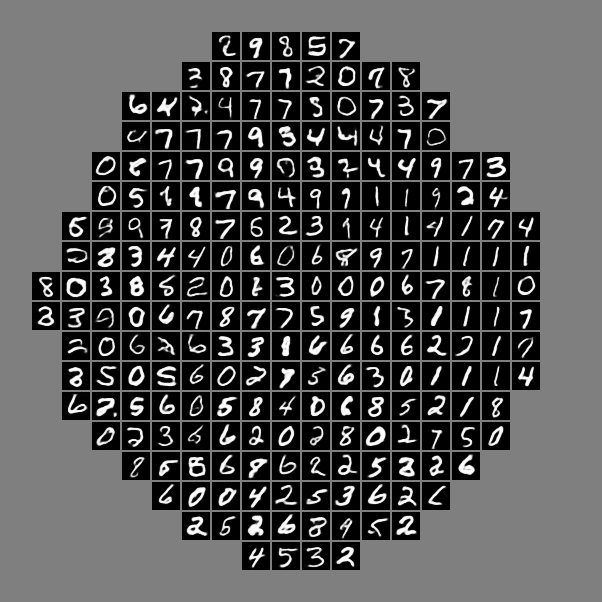

In [36]:
grid_gen_imgs_on_tsne_z=make_grid(torch.Tensor(np.vstack(gen_imgs_on_tsne_z).reshape(400,1,28,28)), nrow=20)
print(grid_gen_imgs_on_tsne_z.shape)

fig = px.imshow(grid_gen_imgs_on_tsne_z[0], binary_string=True)
fig.update_layout(
    title = 'Generated images on t-SNE of the latent vectors',
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()